# Importamos de librerarias y base de datos principal. Asi como su exploración de información y preapración para poder trabajar con ella adecuadamente.

In [ ]:
!pip install geopandas
!pip install dash

In [3]:
import pandas as pd
import numpy as np
import plotly.express as px
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import dash

In [4]:
cdmx = pd.read_csv('/content/conjunto_de_datos_ageb_urbana_09_cpv2020.csv')
cdmx = cdmx.replace('*',0)
cdmx = cdmx[(cdmx['MZA'] == 0) & (cdmx['LOC'] != 0) & (cdmx['AGEB'] != '0000')]
cdmx

,ENTIDAD,NOM_ENT,MUN,NOM_MUN,LOC,NOM_LOC,AGEB,MZA,POBTOT,POBFEM,...,VPH_TELEF,VPH_CEL,VPH_INTER,VPH_STVP,VPH_SPMVPI,VPH_CVJ,VPH_SINRTV,VPH_SINLTC,VPH_SINCINT,VPH_SINTIC
3,9,Ciudad de México,2,Azcapotzalco,1,Total AGEB urbana,0010,0,3183,1695,...,741,772,692,313,221,145,8,14,148,5
30,9,Ciudad de México,2,Azcapotzalco,1,Total AGEB urbana,0025,0,5593,2915,...,1373,1510,1203,478,349,238,28,68,393,14
82,9,Ciudad de México,2,Azcapotzalco,1,Total AGEB urbana,003A,0,4235,2232,...,965,1049,878,361,339,247,5,12,250,0
116,9,Ciudad de México,2,Azcapotzalco,1,Total AGEB urbana,0044,0,4768,2551,...,1124,1237,1076,481,452,294,10,17,254,0
163,9,Ciudad de México,2,Azcapotzalco,1,Total AGEB urbana,0097,0,2176,1115,...,517,562,507,276,260,153,4,3,70,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68759,9,Ciudad de México,17,Venustiano Carranza,1,Total AGEB urbana,1488,0,1079,564,...,171,248,175,92,59,41,6,15,87,0
68791,9,Ciudad de México,17,Venustiano Carranza,1,Total AGEB urbana,1492,0,900,475,...,137,169,129,65,40,25,19,44,79,8
68822,9,Ciudad de México,17,Venustiano Carranza,1,Total AGEB urbana,1505,0,2513,1346,...,593,794,667,354,375,197,3,7,98,0
68870,9,Ciudad de México,17,Venustiano Carranza,1,Total AGEB urbana,151A,0,2248,1208,...,496,686,574,416,313,156,5,7,100,0


Tamaño del data frame

In [5]:
print(
    'Tamaño del DataFrame :', cdmx.shape, '\n'
    'Datos totales :', cdmx.count().sum(),'\n'
    'Campos sin datos :', cdmx.isnull().sum().sum()
    )

Tamaño del DataFrame : (2433, 230) 
Datos totales : 559588 
Campos sin datos : 2


In [6]:
filas = cdmx[cdmx.isnull().any(1)]
filas

,ENTIDAD,NOM_ENT,MUN,NOM_MUN,LOC,NOM_LOC,AGEB,MZA,POBTOT,POBFEM,...,VPH_TELEF,VPH_CEL,VPH_INTER,VPH_STVP,VPH_SPMVPI,VPH_CVJ,VPH_SINRTV,VPH_SINLTC,VPH_SINCINT,VPH_SINTIC
9759,9,Ciudad de México,5,Gustavo A. Madero,1,Total AGEB urbana,0154,0,8184,0,...,0,0,0,0,0,0,0,0,0,0


Identificamos todas las columnas que tienen resultados faltantes

In [7]:
cdmx.columns[cdmx.isnull().any()]

Index(['REL_H_M', 'PROM_HNV'], dtype='object')

Debido a la información que se solicita, creamos una nueva tabla con solo las columnas solicitadas.

In [8]:
locs = list(range(0,7)) + list(range(8,11)) + list(range(52,55))
cdmx_info = cdmx.iloc[:,locs].reset_index(drop=True)
cdmx_info = cdmx_info.astype({'ENTIDAD':str,'MUN':str,'LOC':str,'POBFEM':'int64','POBMAS':'int64','POB0_14':'int64', 'POB15_64':'int64','POB65_MAS':'int64'})
cdmx_info['ENTIDAD'] = cdmx_info['ENTIDAD'].apply(lambda x: x.zfill(2))
cdmx_info['MUN'] = cdmx_info['MUN'].apply(lambda x: x.zfill(3))
cdmx_info['LOC'] = cdmx_info['LOC'].apply(lambda x: x.zfill(4))
cdmx_info['cve_geo'] = cdmx_info['ENTIDAD'] + cdmx_info['MUN'] + cdmx_info['LOC'] + cdmx_info['AGEB']
cdmx_info

,ENTIDAD,NOM_ENT,MUN,NOM_MUN,LOC,NOM_LOC,AGEB,POBTOT,POBFEM,POBMAS,POB0_14,POB15_64,POB65_MAS,cve_geo
0,09,Ciudad de México,002,Azcapotzalco,0001,Total AGEB urbana,0010,3183,1695,1488,388,2124,671,0900200010010
1,09,Ciudad de México,002,Azcapotzalco,0001,Total AGEB urbana,0025,5593,2915,2678,822,3745,1025,0900200010025
2,09,Ciudad de México,002,Azcapotzalco,0001,Total AGEB urbana,003A,4235,2232,2003,645,2841,749,090020001003A
3,09,Ciudad de México,002,Azcapotzalco,0001,Total AGEB urbana,0044,4768,2551,2217,692,3171,905,0900200010044
4,09,Ciudad de México,002,Azcapotzalco,0001,Total AGEB urbana,0097,2176,1115,1061,278,1428,470,0900200010097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2428,09,Ciudad de México,017,Venustiano Carranza,0001,Total AGEB urbana,1488,1079,564,515,268,751,60,0901700011488
2429,09,Ciudad de México,017,Venustiano Carranza,0001,Total AGEB urbana,1492,900,475,425,216,630,54,0901700011492
2430,09,Ciudad de México,017,Venustiano Carranza,0001,Total AGEB urbana,1505,2513,1346,1167,454,1899,160,0901700011505
2431,09,Ciudad de México,017,Venustiano Carranza,0001,Total AGEB urbana,151A,2248,1208,1040,434,1646,168,090170001151A


In [9]:
cdmx_info.dtypes

ENTIDAD      object
NOM_ENT      object
MUN          object
NOM_MUN      object
LOC          object
NOM_LOC      object
AGEB         object
POBTOT        int64
POBFEM        int64
POBMAS        int64
POB0_14       int64
POB15_64      int64
POB65_MAS     int64
cve_geo      object
dtype: object

# Se obtienen datos estadisticos basicos generales de las columnas solicitadas

In [10]:
cdmx_info.iloc[:,7:13].sum() # suma agrupadas por AGEB

POBTOT       9145632
POBFEM       4772911
POBMAS       4372663
POB0_14      1635872
POB15_64     6480731
POB65_MAS    1019322
dtype: int64

In [12]:
cdmx_info.describe() #estaditicas agrupadas por AGEB

,POBTOT,POBFEM,POBMAS,POB0_14,POB15_64,POB65_MAS
count,2433.000000,2433.000000,2433.000000,2433.000000,2433.000000,2433.000000
mean,3758.993835,1961.739005,1797.230991,672.368270,2663.678997,418.956843
std,2433.068753,1258.656841,1190.131839,510.387283,1757.316682,250.465406
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2045.000000,1074.000000,961.000000,294.000000,1438.000000,242.000000
50%,3396.000000,1778.000000,1606.000000,561.000000,2396.000000,394.000000
75%,4992.000000,2612.000000,2386.000000,931.000000,3524.000000,562.000000
max,21198.000000,11128.000000,10616.000000,3701.000000,16887.000000,1825.000000


In [40]:
cdmx_sort = cdmx_info.sort_values('POBTOT', ascending=False).head(10) #Top 10 de AGEBS por población total
cdmx_group = cdmx_sort[['NOM_MUN','AGEB', 'POBTOT']]
cdmx_group

,NOM_MUN,AGEB,POBTOT
1267,Álvaro Obregón,0135,21198
2192,Miguel Hidalgo,0444,18174
2279,Miguel Hidalgo,1349,15549
288,Cuajimalpa de Morelos,0316,15087
282,Cuajimalpa de Morelos,0369,14609
283,Cuajimalpa de Morelos,0373,14170
200,Coyoacán,1162,14061
1722,Tlalpan,2121,13974
855,Iztapalapa,1994,13946
1356,Álvaro Obregón,1171,13918


In [14]:
cdmx_info.groupby(['NOM_MUN']).size().sort_values(ascending=False) #cantidad de AGEBS por municipio

NOM_MUN
Iztapalapa                458
Gustavo A. Madero         305
Tlalpan                   208
Álvaro Obregón            199
Coyoacán                  156
Cuauhtémoc                153
Venustiano Carranza       151
Miguel Hidalgo            130
Xochimilco                122
Tláhuac                   111
Iztacalco                 110
Azcapotzalco              103
Benito Juárez             102
La Magdalena Contreras     52
Milpa Alta                 42
Cuajimalpa de Morelos      31
dtype: int64

In [48]:
cdmx_gen = cdmx_info[['NOM_MUN','AGEB', 'POBMAS', 'POBFEM']]
cdmx_gen['Dif'] = (cdmx_gen['POBMAS']-cdmx_gen['POBFEM']).abs()
cdmx_gen.sort_values('Dif', ascending=False).head(10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,NOM_MUN,AGEB,POBMAS,POBFEM,Dif
298,Gustavo A. Madero,0154,8184,0,8184
855,Iztapalapa,1994,10616,3330,7286
1819,Xochimilco,0599,4347,785,3562
795,Iztapalapa,1123,3510,229,3281
1725,Tlalpan,2155,3152,1704,1448
270,Cuajimalpa de Morelos,0195,4937,6047,1110
1267,Álvaro Obregón,0135,10070,11128,1058
1356,Álvaro Obregón,1171,6480,7438,958
1408,Álvaro Obregón,1858,5572,6481,909
268,Cuajimalpa de Morelos,0176,4203,5089,886


In [88]:
cd = cdmx_gen[['NOM_MUN', 'POBMAS', 'POBFEM']]
cd = cd.groupby(['NOM_MUN']).sum()
cd['Dif'] = (cd['POBMAS']-cd['POBFEM']).abs()
cd.sort_values('Dif', ascending=False).head(10)

,POBMAS,POBFEM,Dif
NOM_MUN,,,
Iztapalapa,887651,947835,60184
Gustavo A. Madero,563866,609471,45605
Álvaro Obregón,360935,398068,37133
Coyoacán,289110,325337,36227
Tlalpan,327616,357937,30321
Benito Juárez,202121,232032,29911
Cuauhtémoc,260951,284933,23982
Miguel Hidalgo,195456,218994,23538
Venustiano Carranza,210115,233585,23470


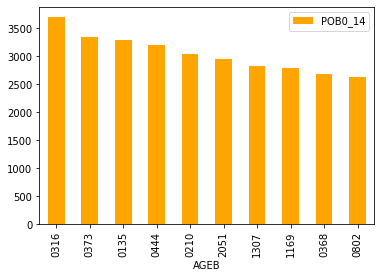

In [100]:
guarderia = cdmx_info[cdmx_info['NOM_MUN'] == 'Cuauhtémoc']
guarderia = guarderia[['AGEB','POB0_14']]
guarderia = guarderia.sort_values('POB0_14', ascending=False).head(10)
guarderia.plot(x='AGEB',y='POB0_14',kind ='bar', color='orange')

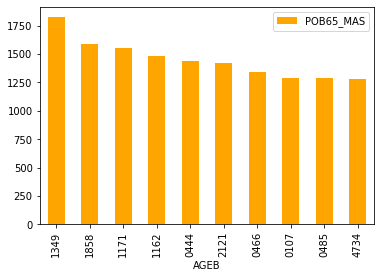

In [107]:
asilo = cdmx_info[cdmx_info['NOM_MUN'] == 'Cuauhtémoc']
asilo = asilo[['AGEB','POB65_MAS']]
asilo = asilo.sort_values('POB65_MAS', ascending=False).head(10)
asilo.plot(x='AGEB',y='POB65_MAS',kind ='bar', color='orange')

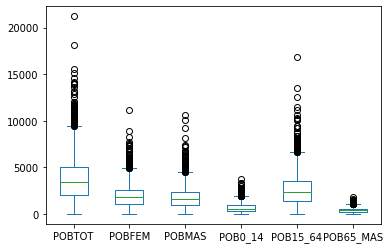

In [16]:
cdmx_info.plot.box()

In [17]:
cdmx_mun = cdmx_info.groupby(['NOM_MUN']).sum() #Nuevo data frame agrupado por municipio
cdmx_mun

,POBTOT,POBFEM,POBMAS,POB0_14,POB15_64,POB65_MAS
NOM_MUN,,,,,,
Azcapotzalco,432205,227255,204949,70366,306611,54862
Benito Juárez,434153,232032,202121,51243,321279,61593
Coyoacán,614447,325337,289110,91325,432544,90446
Cuajimalpa de Morelos,212735,111031,101704,44016,152035,16571
Cuauhtémoc,545884,284933,260951,83468,398058,64289
Gustavo A. Madero,1173351,609471,563866,212343,819385,141373
Iztacalco,404695,212343,192352,69312,286131,49074
Iztapalapa,1835486,947835,887651,366835,1293944,174312
La Magdalena Contreras,246428,128767,117661,47068,173311,26006


In [18]:
cdmx_mun.describe().astype(int) #estaditicas agrupadas por Municipio

,POBTOT,POBFEM,POBMAS,POB0_14,POB15_64,POB65_MAS
count,16,16,16,16,16,16
mean,571602,298306,273291,102242,405045,63707
std,416566,215111,201493,83061,292545,43469
min,128710,66278,62432,29909,89079,9708
25%,399851,208922,190929,59674,283027,37415
50%,433179,229643,207015,80081,308792,54547
75%,632225,333487,298736,99856,445949,76004
max,1835486,947835,887651,366835,1293944,174312


# Obtenemos mas gráficos que nos pueden ayudar a entender nuestros datos.

/usr/local/lib/python3.7/dist-packages/pandas/plotting/_matplotlib/__init__.py:71: UserWarning: When passing multiple axes, sharex and sharey are ignored. These settings must be specified when creating axes
  plot_obj.generate()


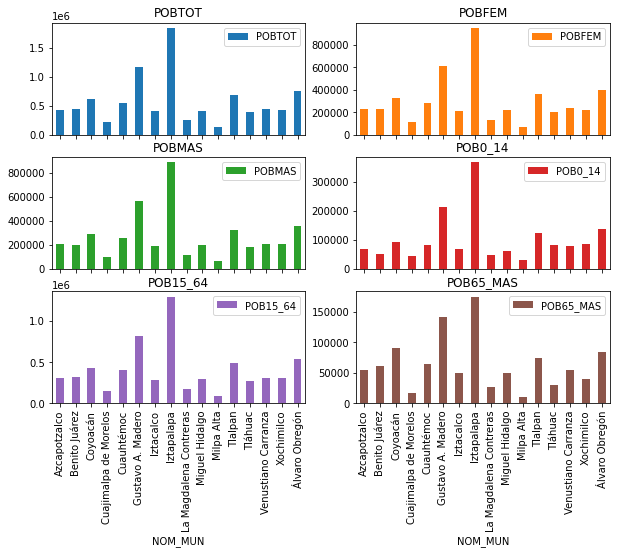

In [19]:
fig, ax = plt.subplots(3,2,figsize=(10,7))
cdmx_mun.plot(kind='bar', ax=ax, subplots=True, sharex=True, sharey=False,)
plt.show()

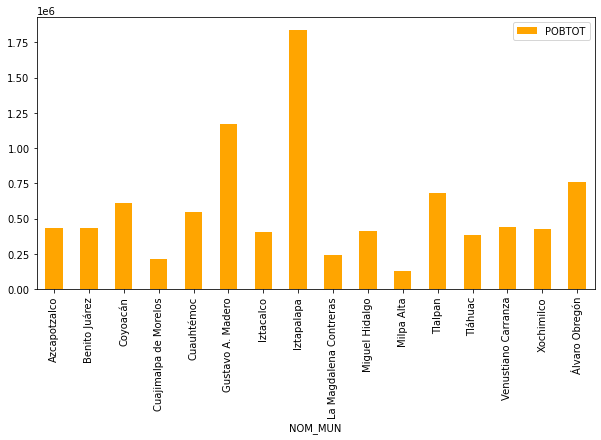

In [20]:
fig, ax = plt.subplots(figsize=(10,5))
cdmx_mun[['POBTOT']].plot(kind='bar', ax=ax, subplots=False, sharex=True, sharey=False, color='orange')
plt.show()

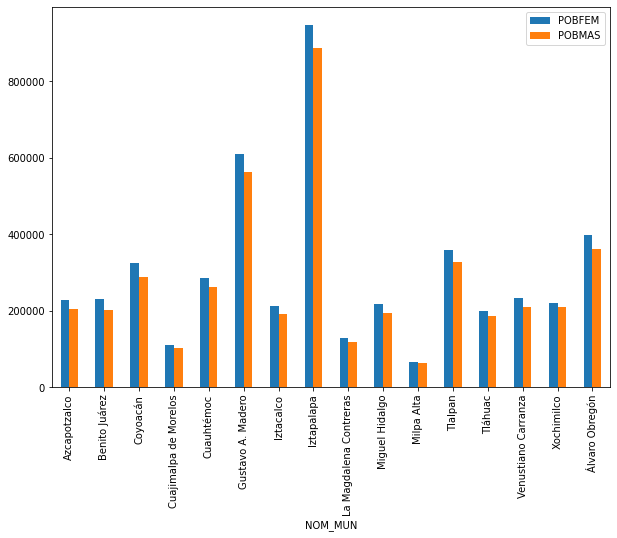

In [21]:
fig, ax = plt.subplots(figsize=(10,7))
cdmx_mun[['POBFEM',	'POBMAS']].plot(kind='bar', ax=ax, subplots=False, sharex=True, sharey=False,)
plt.show()

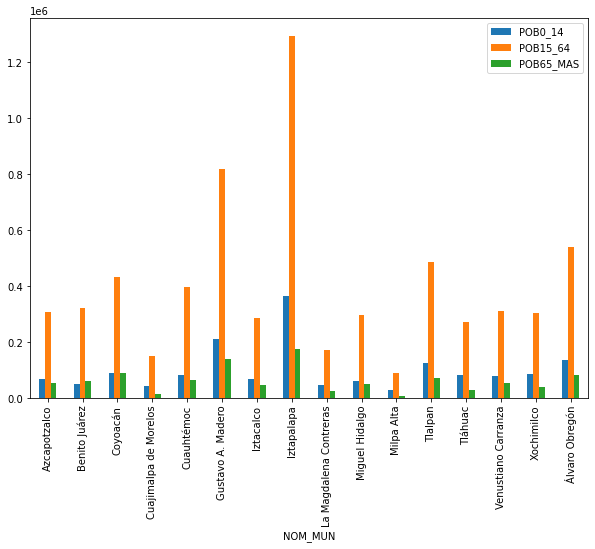

In [22]:
fig, ax = plt.subplots(figsize=(10,7))
cdmx_mun[['POB0_14',	'POB15_64',	'POB65_MAS']].plot(kind='bar', ax=ax, subplots=False, sharex=True, sharey=False,)
plt.show()



---



---



# Importamos el archivo SHP para generar los mapas necesarios y juntar la información con nuestro DataFrame.

In [23]:
maps = gpd.read_file('/content/df_ageb_urbana.shp')
maps

,CVEGEO,CVE_AGEB,CVE_ENT,CVE_LOC,CVE_MUN,geometry
0,0900200010947,0947,09,0001,002,"POLYGON ((-99.18322 19.50387, -99.18652 19.504..."
1,0900200010896,0896,09,0001,002,"POLYGON ((-99.17205 19.47376, -99.17217 19.472..."
2,0900200011184,1184,09,0001,002,"POLYGON ((-99.20599 19.50109, -99.20607 19.500..."
3,0900200011127,1127,09,0001,002,"POLYGON ((-99.19118 19.50461, -99.19567 19.506..."
4,090020001010A,010A,09,0001,002,"POLYGON ((-99.20181 19.50410, -99.20181 19.504..."
...,...,...,...,...,...,...
2427,0901700011492,1492,09,0001,017,"POLYGON ((-99.05794 19.42639, -99.05854 19.426..."
2428,0901700011505,1505,09,0001,017,"POLYGON ((-99.05787 19.42450, -99.05820 19.424..."
2429,090170001151A,151A,09,0001,017,"POLYGON ((-99.06372 19.42927, -99.05890 19.424..."
2430,0901700011524,1524,09,0001,017,"POLYGON ((-99.05723 19.42232, -99.05774 19.422..."


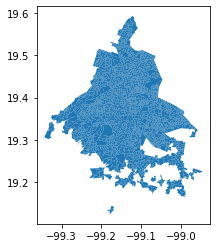

In [24]:
maps.plot()

In [25]:
df= cdmx_info.merge(maps, how='left', left_on= ['cve_geo'], right_on=['CVEGEO'])
df.head(5)

,ENTIDAD,NOM_ENT,MUN,NOM_MUN,LOC,NOM_LOC,AGEB,POBTOT,POBFEM,POBMAS,POB0_14,POB15_64,POB65_MAS,cve_geo,CVEGEO,CVE_AGEB,CVE_ENT,CVE_LOC,CVE_MUN,geometry
0,09,Ciudad de México,002,Azcapotzalco,0001,Total AGEB urbana,0010,3183,1695,1488,388,2124,671,0900200010010,0900200010010,0010,09,0001,002,"POLYGON ((-99.20461 19.51170, -99.20477 19.511..."
1,09,Ciudad de México,002,Azcapotzalco,0001,Total AGEB urbana,0025,5593,2915,2678,822,3745,1025,0900200010025,0900200010025,0025,09,0001,002,"POLYGON ((-99.20204 19.51041, -99.20211 19.510..."
2,09,Ciudad de México,002,Azcapotzalco,0001,Total AGEB urbana,003A,4235,2232,2003,645,2841,749,090020001003A,090020001003A,003A,09,0001,002,"POLYGON ((-99.20969 19.51173, -99.20913 19.511..."
3,09,Ciudad de México,002,Azcapotzalco,0001,Total AGEB urbana,0044,4768,2551,2217,692,3171,905,0900200010044,0900200010044,0044,09,0001,002,"POLYGON ((-99.20530 19.51033, -99.20529 19.510..."
4,09,Ciudad de México,002,Azcapotzalco,0001,Total AGEB urbana,0097,2176,1115,1061,278,1428,470,0900200010097,0900200010097,0097,09,0001,002,"POLYGON ((-99.20535 19.50877, -99.20523 19.508..."


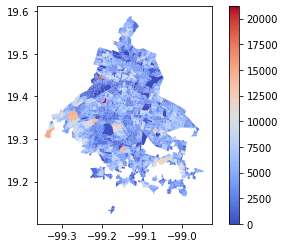

In [26]:
gpd_df = gpd.GeoDataFrame(df, geometry='geometry')
gpd_df.plot(column='POBTOT', cmap = 'coolwarm', legend=True)

In [80]:
fig = px.choropleth(cdmx_info, 
                    locations="cve_geo",
                    geojson = maps,
                    color = 'NOM_MUN',
                    featureidkey= 'properties.CVEGEO',
                    hover_data = ['NOM_MUN'],
                    title='Población por AGEB') 
fig.update_geos(showcountries=False, showcoastlines=False, showland=False, fitbounds="locations",visible=False) 
fig.show()

In [60]:
fig = px.choropleth(cdmx_info, 
                    locations="cve_geo",
                    geojson = maps,
                    featureidkey= 'properties.CVEGEO',
                    hover_data = ['NOM_MUN'],
                    color="POBTOT", 
                    color_continuous_scale='YlOrBr', 
                    title='Población por AGEB') 
fig.update_geos(showcountries=False, showcoastlines=False, showland=False, fitbounds="locations") 
fig.show()

# **En el mapa Choropleth agrega la ubicación de todas las estaciones del metro y pinta los puntos de naranja.**

Obtenemos las ubicaciones de las estaciones y convertimos la información para poder anexarla al mapa.

In [ ]:
metro = gpd.read_file('/content/STC_Metro_estaciones_utm14n.shp') 
metro_geo = pd.DataFrame(metro)
metro_geo = metro_geo.astype({'geometry':str})
metro_geo[['Longitude','Latitude']] = metro_geo['geometry'].str.strip('POINT, Z ( ) 0').str.split(' ', expand=True).rename(columns={0:'Longitude', 1:'Latitude'})
metro_geo

In [59]:
color = {'STC Metro':'orange'}

fig = px.choropleth(cdmx_info, 
                    locations="cve_geo",
                    geojson = maps,
                    featureidkey= 'properties.CVEGEO',
                    hover_data = ['NOM_MUN'],
                    color="POBTOT", 
                    color_continuous_scale='Greys', 
                    title='Población por AGEB') 

fig1= px.scatter_geo(metro_geo, 
                    lat='Latitude', 
                    lon='Longitude',
                    hover_data = ['NOMBRE'],
                    color='SISTEMA',
                    color_discrete_map = color )


fig.update_geos(showcountries=False, showcoastlines=False, showland=False, fitbounds="locations")
fig.add_trace(fig1.data[0])
fig.show()

In [84]:
fig = px.choropleth(cdmx_info, 
                    locations="cve_geo",
                    geojson = maps,
                    color = 'NOM_MUN',
                    featureidkey= 'properties.CVEGEO',
                    hover_data = ['NOM_MUN'],
                    title='Población por AGEB') 
fig.update_geos( fitbounds="locations",visible=False) 
fig.show()